# Vehicle Detection Project

The goals / steps of this project are the following:

   * Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
   * Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector.
   * Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
   * Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
   * Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
   * Estimate a bounding box for vehicles detected.

In [1]:
## Loading library

import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob 
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler






In [2]:
## Loading images filepathes
vehicle_filepathes = glob.glob('vehicles/**/*.png')
non_vehicle_filepathes = glob.glob('non-vehicles/**/*.png')


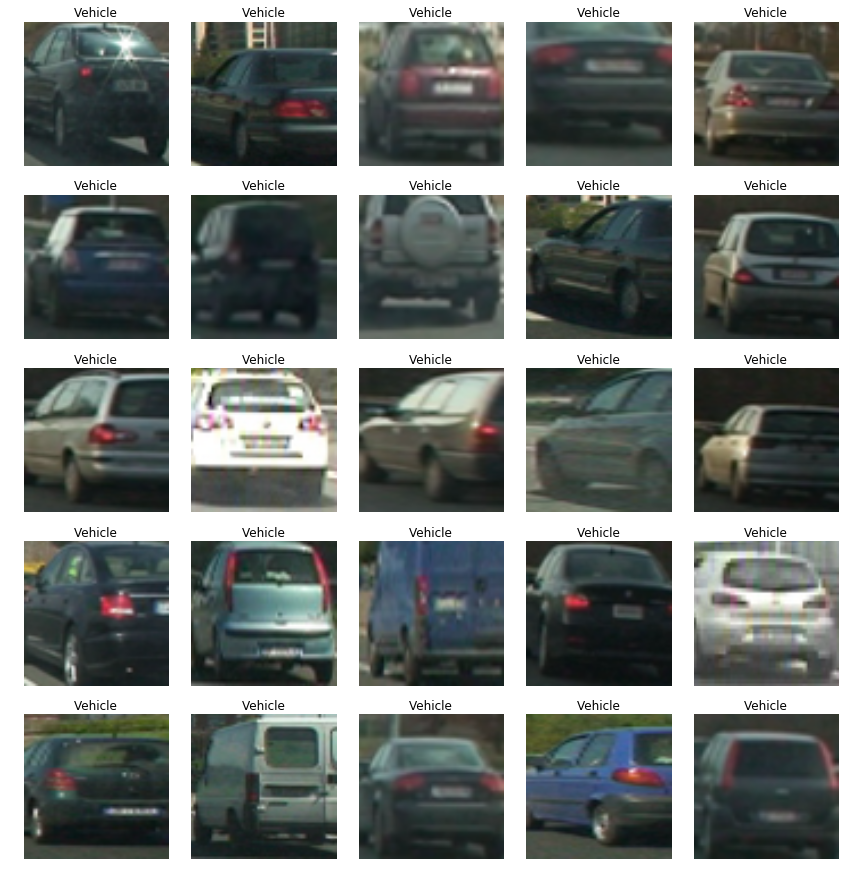

In [3]:
##Visualize car
fig, axs = plt.subplots(5,5, figsize = (15,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
inds = np.random.choice(range(25), 25, replace=False)

for i in range(0,25):
    image = cv2.imread(vehicle_filepathes[inds[i]])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('Vehicle')
    axs[i].imshow(image)


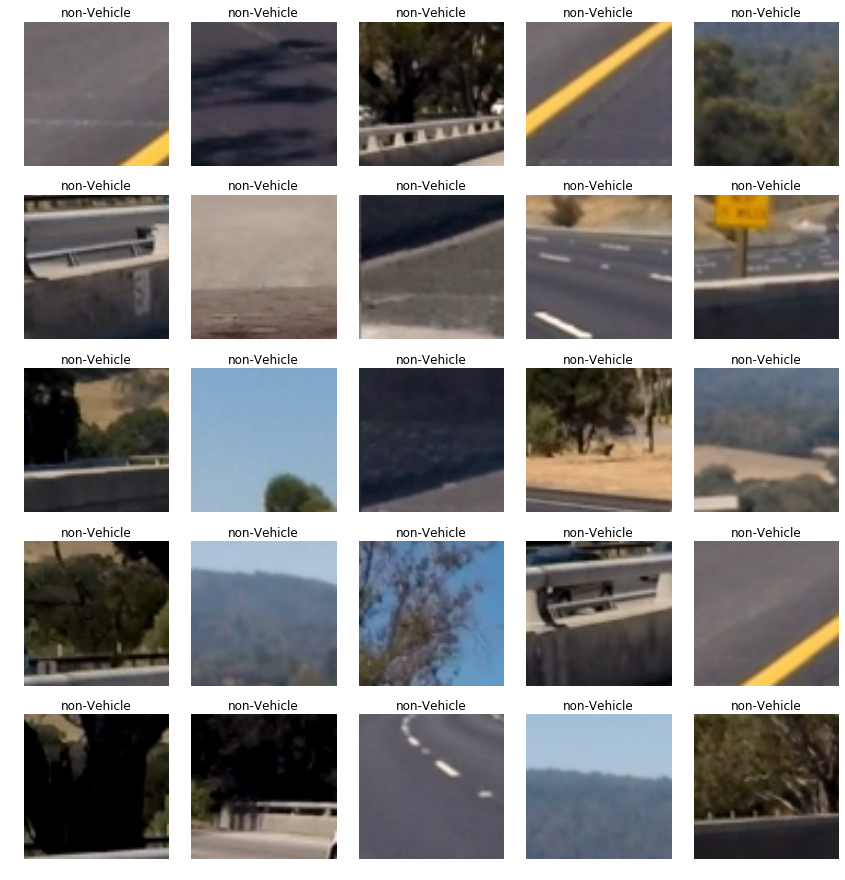

In [57]:
fig, axs = plt.subplots(5,5, figsize = (15,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()
inds = np.random.choice(range(25), 25, replace=False)

for i in range(0,25):
    image = cv2.imread(non_vehicle_filepathes[inds[i]])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('non-Vehicle')
    axs[i].imshow(image)


## Extract and Visualize Histogram of Oriented Gradient Feature

In [5]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, vis=False,
                    feature_vec=True):
    
    if vis == True:
        
        hog_features, hog_image = hog(img, orientations=orient,
                                 pixels_per_cell=(pix_per_cell,pix_per_cell),
                                 cells_per_block=(cell_per_block,cell_per_block),
                                 visualise=vis, feature_vector=feature_vec,
                                 block_norm="L2-Hys")
        
        return hog_features, hog_image
    
    else:
        
        hog_features = hog(img, orientations=orient,
                           pixels_per_cell=(pix_per_cell,pix_per_cell),
                           cells_per_block=(cell_per_block,cell_per_block),
                           visualise=vis, feature_vector=feature_vec,
                           block_norm="L2-Hys")
        
        return hog_features

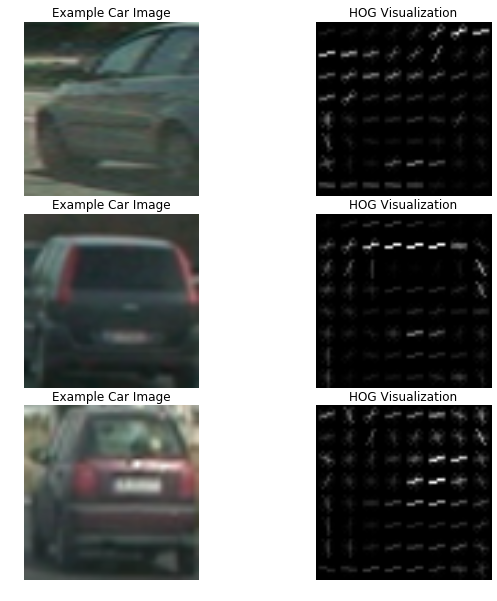

In [6]:
fig, axs = plt.subplots(3,2, figsize = (10,10))
fig.subplots_adjust(hspace = .1, wspace=.1)



for i in range(0,3):
    image = cv2.imread(vehicle_filepathes[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    features, hog_image = get_hog_features(gray_image, orient= 9, 
                        pix_per_cell= 8, cell_per_block= 8, 
                        vis=True, feature_vec=True)
    
    axs[i,0].axis('off')
    axs[i,0].imshow(image, cmap='gray')
    axs[i,0].set_title('Example Car Image')
    axs[i,1].axis('off')
    axs[i,1].imshow(hog_image, cmap='gray')
    axs[i,1].set_title('HOG Visualization')


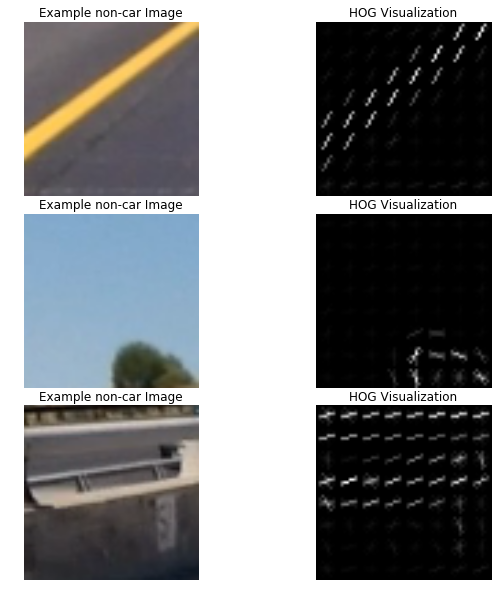

In [7]:
fig, axs = plt.subplots(3,2, figsize = (10,10))
fig.subplots_adjust(hspace = .1, wspace=.1)



for i in range(0,3):
    image = cv2.imread(non_vehicle_filepathes[i])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    features, hog_image = get_hog_features(gray_image, orient= 9, 
                        pix_per_cell= 8, cell_per_block= 8, 
                        vis=True, feature_vec=True)
    
    axs[i,0].axis('off')
    axs[i,0].imshow(image, cmap='gray')
    axs[i,0].set_title('Example non-car Image')
    axs[i,1].axis('off')
    axs[i,1].imshow(hog_image, cmap='gray')
    axs[i,1].set_title('HOG Visualization')

## Color Transform and Feature Extract

In [8]:
def bin_spatial(img, size=(32,32)):   
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    return np.hstack((color1, color2, color3))

In [9]:
def color_hist(img,nbins=32, bins_Range=(0,256)):
    
    channel1_hist = np.histogram(img[:,:,0], nbins, range=bins_Range)
    channel2_hist = np.histogram(img[:,:,1], nbins, range=bins_Range)
    channel3_hist = np.histogram(img[:,:,2], nbins, range=bins_Range)
    
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    return hist_features

In [10]:
## Extract features
def extract_features(imgs, cspace='RGB', orient=9, 
                     spatial_size=(32,32),hist_bins=32,
                    pix_per_cell=8, cell_per_block=2, hog_channel=0,
                    spatial_feat=True, hist_feat=True, hog_feat=True):
    
    features = []
    
    for file in imgs:
        file_features = []
        image = mpimg.imread(file)

        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)
        
        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image,size=spatial_size)
            file_features.append(spatial_features)
        
        if hist_feat == True:
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
            
        if hog_feat == True:
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],
                                                    orient,pix_per_cell,cell_per_block,
                                                    vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel],
                                                    orient,pix_per_cell,cell_per_block,
                                                    vis=False, feature_vec=True)
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
        #features.append(file_features)
    return features

In [12]:
import time

color_space = 'LUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 11  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

t1 = time.time()

car_features = extract_features(vehicle_filepathes, cspace=color_space, orient=orient,
                                spatial_size=spatial_size,hist_bins=hist_bins, 
                                pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                                hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                hist_feat=hist_feat, hog_feat=hog_feat)

non_car_features = extract_features(non_vehicle_filepathes, cspace=color_space, orient=orient,
                                spatial_size=spatial_size,hist_bins=hist_bins, 
                                pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, 
                                hog_channel=hog_channel, spatial_feat=spatial_feat, 
                                hist_feat=hist_feat, hog_feat=hog_feat)
    

t2=time.time()

print('Features extracting time:', round(t2-t1, 2))



Features extracting time: 126.84


In [13]:
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import train_test_split


X = np.vstack((car_features,non_car_features)).astype(np.float64)


y = np.hstack((np.ones(len(car_features)), np.zeros(len(non_car_features))))

rand_state = np.random.randint(0,100)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
                                                    random_state=rand_state)

X_scaler = StandardScaler().fit(X_train)

X_train = X_scaler.transform(X_train)
X_test = X_scaler.transform(X_test)

svc = LinearSVC()

t1 = time.time()
svc.fit(X_train, y_train)
t2 = time.time()

print('Test Accuracy of SVC = ', round(svc.score(X_test,y_test), 4))
print('Train linearSVC time:', round(t2-t1, 2))

/home/yue/miniconda3/envs/carnd-term1/lib/python3.5/site-packages/sklearn/cross_validation.py:41: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Test Accuracy of SVC =  0.9828
Train linearSVC time: 33.7


## Sliding Window Search

In [68]:
def find_cars(img, ystart, ystop, color_space, scale, svc, X_scaler, orient, pix_per_cell
              , cell_per_block, spatial_size, hist_bins, all_rectangles=False,xstart = 420):
    
    draw_img = np.copy(img)
    img = img.astype(np.float32)/255
    
    rectangles = []
    
    img_tosearch = img[ystart:ystop,:,:]
    if color_space != 'RGB':
        if color_space == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(img_tosearch)
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale),np.int(imshape[0]/scale)))
        
    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]
    
    nxblocks = (ch1.shape[1] // pix_per_cell)  - cell_per_block + 1
    nyblocks = (ch1.shape[0] // pix_per_cell)  - cell_per_block + 1
    
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1

    cells_per_step = 2
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)
    
    for xb in range(nxsteps):
        for yb in range(nysteps):
            ypos = yb * cells_per_step
            xpos = xb * cells_per_step

            
            hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
            hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window],(64,64))
            
            spatial_features = bin_spatial(subimg, size=spatial_size)
            hist_features = color_hist(subimg, nbins=hist_bins)

            
            test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1)) 
            
            test_prediction = svc.predict(test_features)
            #test_prediction = svc.predict(hog_features)
            if (test_prediction == 1 and np.int(xleft*scale) > xstart)or all_rectangles:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                #cv2.rectangle(draw_img, (xbox_left,ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart),(0,0,255),6)
                rectangles.append(((xbox_left,ytop_draw+ystart), (xbox_left+win_draw,ytop_draw+win_draw+ystart)))
    
    #return draw_img
    return rectangles


            
            
    

In [69]:
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):

    imcopy = np.copy(img)

    for bbox in bboxes:

        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)

    return imcopy

## Define search areas and scales value 

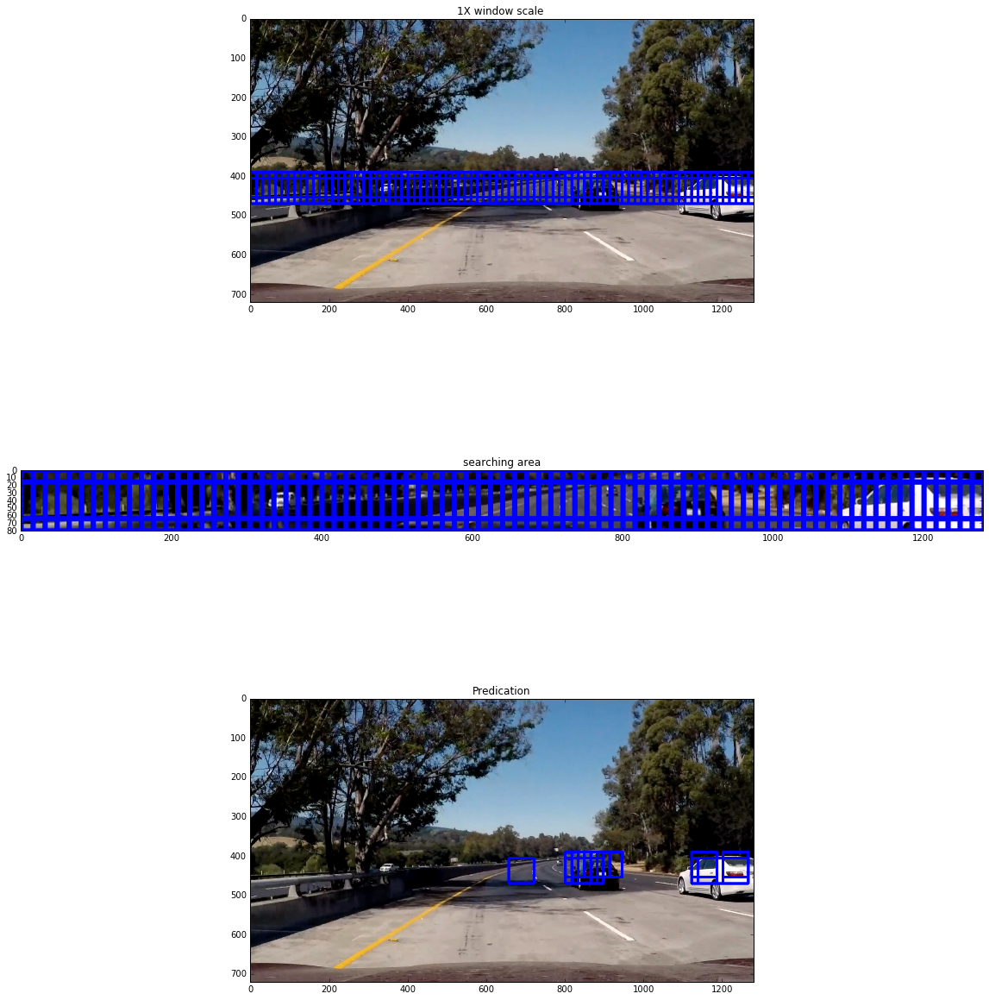

In [176]:

color_space = 'LUV'
orient = 11  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins

rects = []


all_rectangles = True

test_img = mpimg.imread('test_images/test5.jpg')

ystart = 390
ystop = 470
xstart = 250
scale = 1

rects_pred = []
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))

all_rectangles = False
rects_pred.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rectangles = [item for sublist in rects for item in sublist] 
rectangels_pred = [item for sublist in rects_pred for item in sublist] 

out_img = draw_boxes(test_img, rectangles)
out_img_pred = draw_boxes(test_img, rectangels_pred)
img_tosearch = out_img[ystart:ystop,:,:]
imshape = img_tosearch.shape



fig, axs = plt.subplots(3,1, figsize = (20,20))
axs[0].set_title('1X window scale ')
axs[0].imshow(out_img)
axs[1].set_title('searching area')
axs[1].imshow(img_tosearch)
axs[2].set_title('Predication')
axs[2].imshow(out_img_pred)


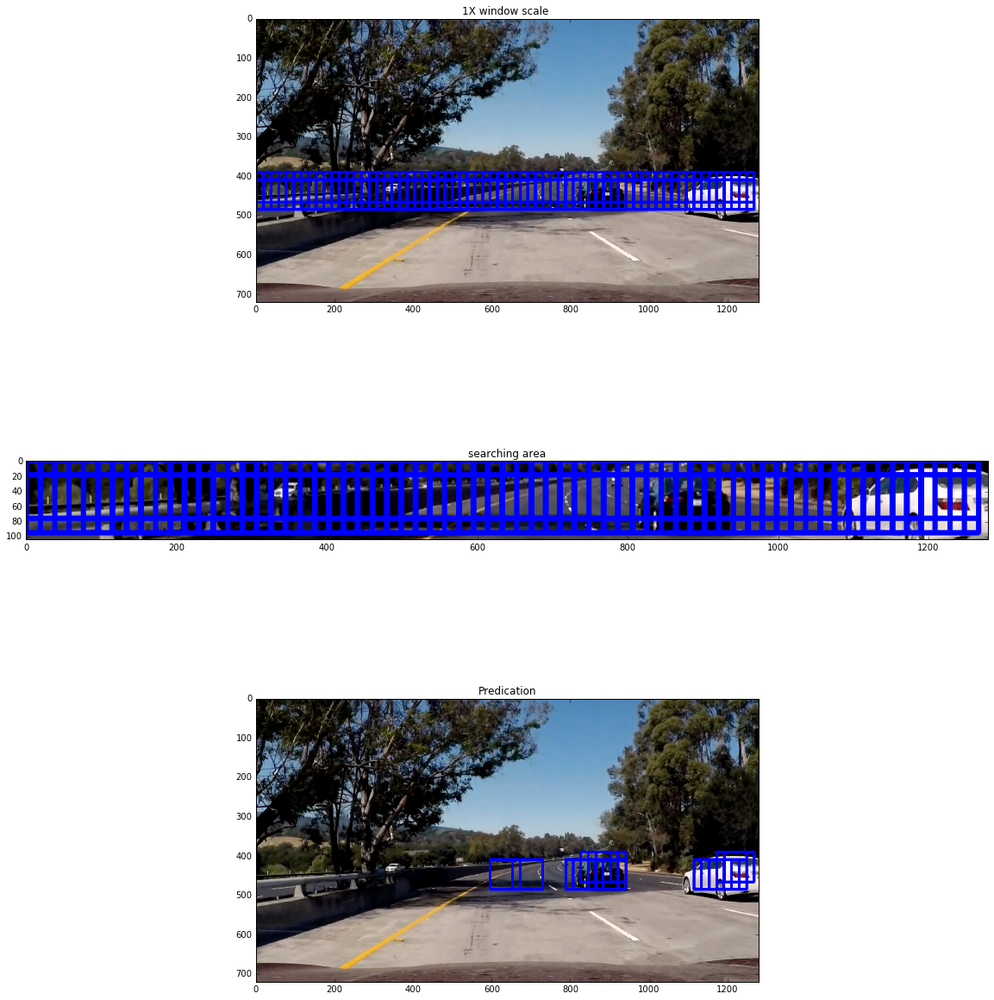

In [178]:
all_rectangles = True

rects = []



ystart = 390
ystop = 494
scale = 1.2

rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rects_pred = []
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))

all_rectangles = False
rects_pred.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rectangles = [item for sublist in rects for item in sublist] 
rectangels_pred = [item for sublist in rects_pred for item in sublist] 

out_img = draw_boxes(test_img, rectangles)
out_img_pred = draw_boxes(test_img, rectangels_pred)
img_tosearch = out_img[ystart:ystop,:,:]
imshape = img_tosearch.shape



fig, axs = plt.subplots(3,1, figsize = (20,20))
axs[0].set_title('1X window scale ')
axs[0].imshow(out_img)
axs[1].set_title('searching area')
axs[1].imshow(img_tosearch)
axs[2].set_title('Predication')
axs[2].imshow(out_img_pred)

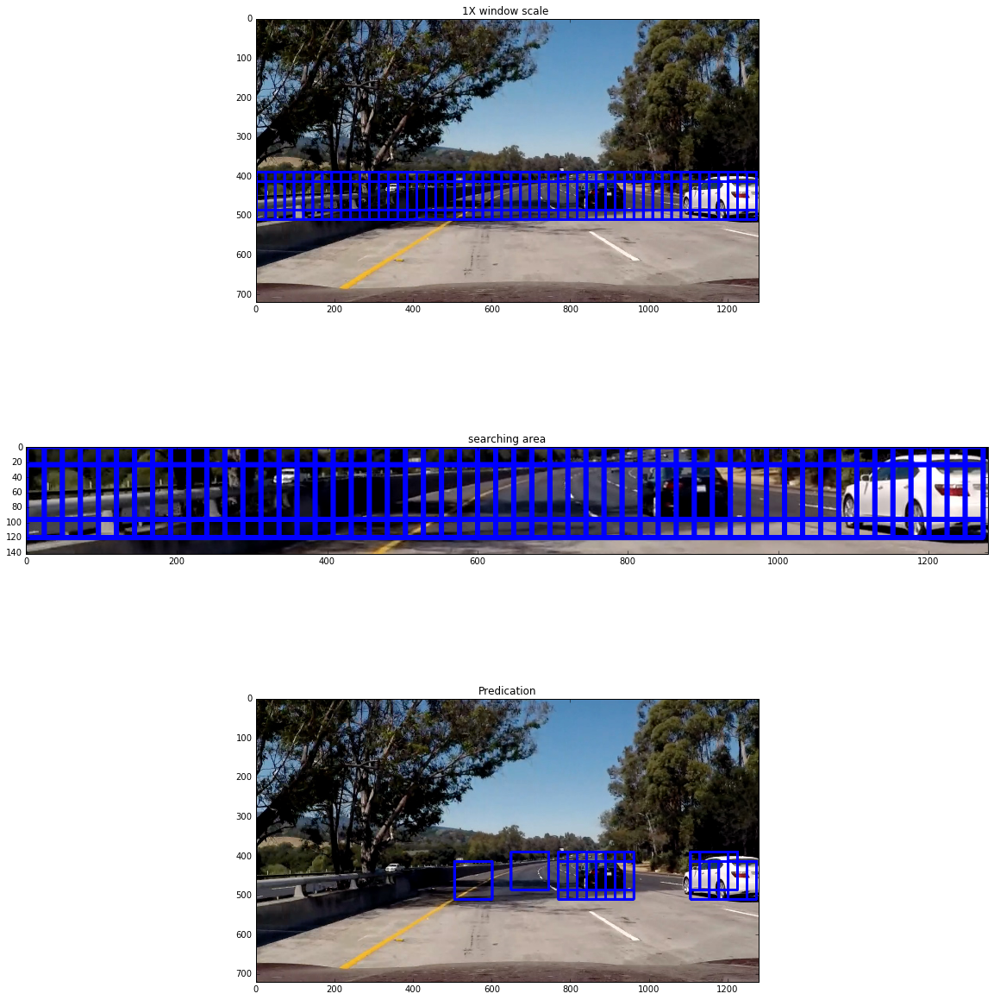

In [179]:
all_rectangles = True

rects = []


ystart = 390
ystop = 532
scale = 1.5

rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rects_pred = []
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))

all_rectangles = False
rects_pred.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rectangles = [item for sublist in rects for item in sublist] 
rectangels_pred = [item for sublist in rects_pred for item in sublist] 

out_img = draw_boxes(test_img, rectangles)
out_img_pred = draw_boxes(test_img, rectangels_pred)
img_tosearch = out_img[ystart:ystop,:,:]
imshape = img_tosearch.shape



fig, axs = plt.subplots(3,1, figsize = (20,20))
axs[0].set_title('1X window scale ')
axs[0].imshow(out_img)
axs[1].set_title('searching area')
axs[1].imshow(img_tosearch)
axs[2].set_title('Predication')
axs[2].imshow(out_img_pred)

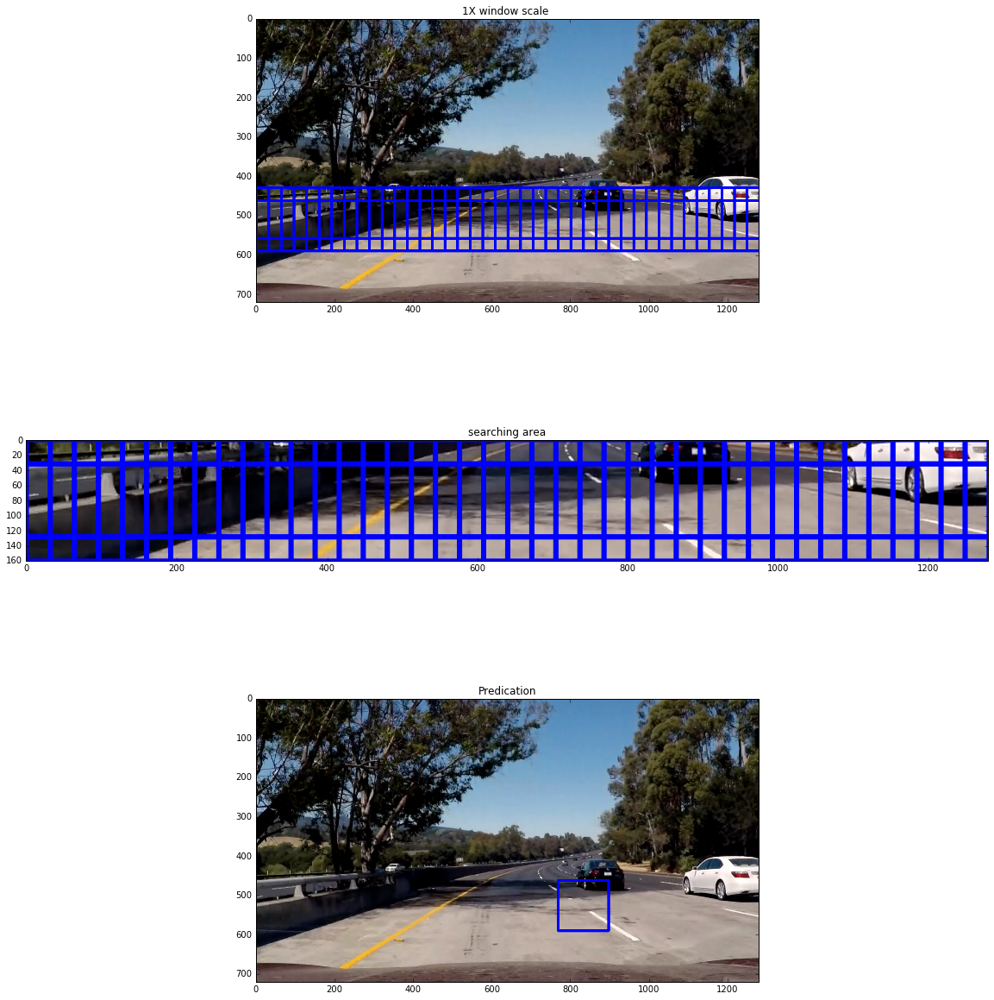

In [180]:
all_rectangles = True

rects = []


ystart = 430
ystop = 590
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rects_pred = []
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))

all_rectangles = False
rects_pred.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rectangles = [item for sublist in rects for item in sublist] 
rectangels_pred = [item for sublist in rects_pred for item in sublist] 

out_img = draw_boxes(test_img, rectangles)
out_img_pred = draw_boxes(test_img, rectangels_pred)
img_tosearch = out_img[ystart:ystop,:,:]
imshape = img_tosearch.shape



fig, axs = plt.subplots(3,1, figsize = (20,20))
axs[0].set_title('1X window scale ')
axs[0].imshow(out_img)
axs[1].set_title('searching area')
axs[1].imshow(img_tosearch)
axs[2].set_title('Predication')
axs[2].imshow(out_img_pred)

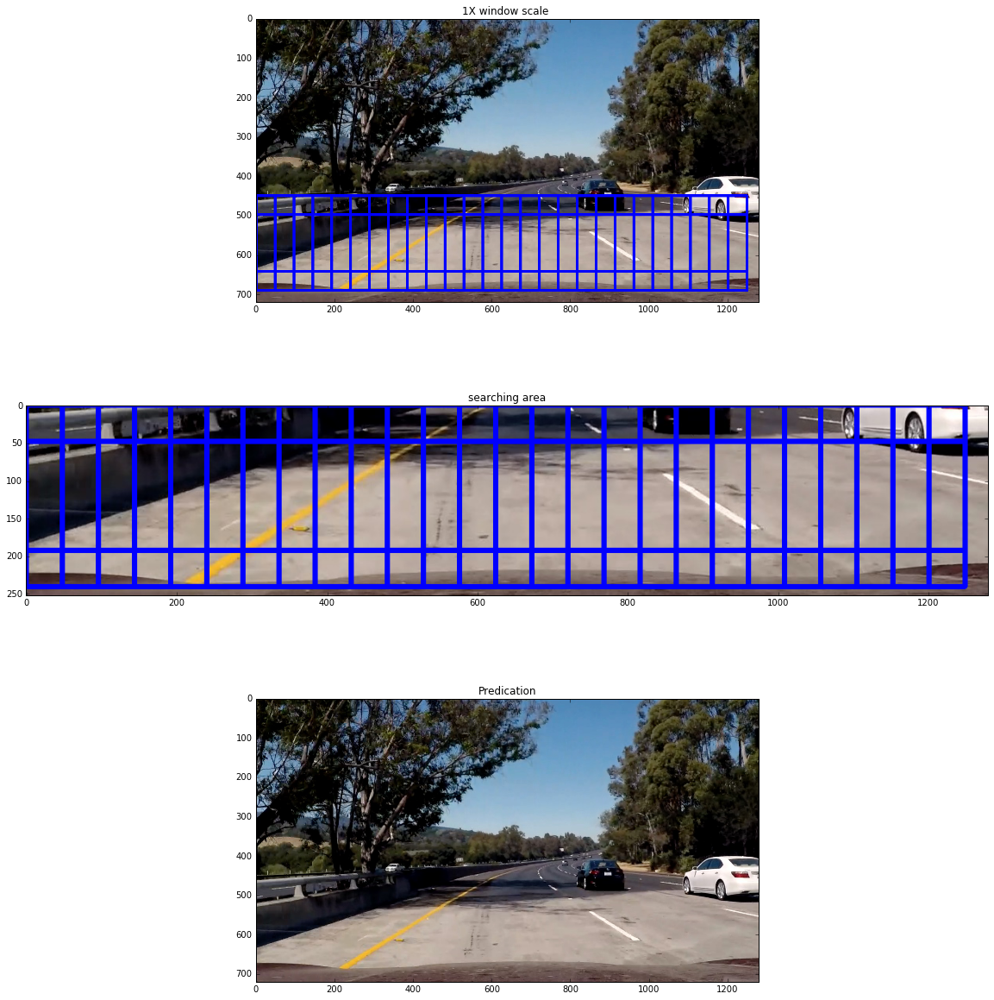

In [181]:
all_rectangles = True
rects = []


ystart = 450
ystop = 702
scale = 3.0

rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rects_pred = []
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))

all_rectangles = False
rects_pred.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


rectangles = [item for sublist in rects for item in sublist] 
rectangels_pred = [item for sublist in rects_pred for item in sublist] 

out_img = draw_boxes(test_img, rectangles)
out_img_pred = draw_boxes(test_img, rectangels_pred)
img_tosearch = out_img[ystart:ystop,:,:]
imshape = img_tosearch.shape



fig, axs = plt.subplots(3,1, figsize = (20,20))
axs[0].set_title('1X window scale ')
axs[0].imshow(out_img)
axs[1].set_title('searching area')
axs[1].imshow(img_tosearch)
axs[2].set_title('Predication')
axs[2].imshow(out_img_pred)

## Multi-scale Windows

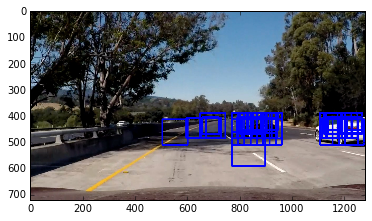

In [209]:
test_img = mpimg.imread('test_images/test5.jpg')

rects = []

color_space = 'LUV'
orient = 11  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins

all_rectangles = False


ystart = 390
ystop = 470
scale = 1.0
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


ystart = 390
ystop = 494
scale = 1.2
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))

ystart = 390
ystop = 532
scale = 1.5

rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


ystart = 430
ystop = 590
scale = 2.0
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))



ystart = 462
ystop = 702
scale = 3.0

rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))





rectangles = [item for sublist in rects for item in sublist]
test_img_rects = draw_boxes(test_img, rectangles)
plt.imshow(test_img_rects)


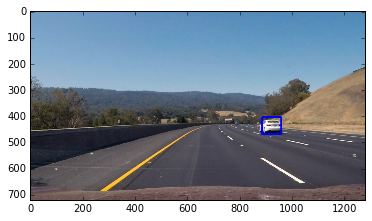

In [193]:
test_img = mpimg.imread('test_images/test3.jpg')

rects = []

color_space = 'LUV'
orient = 11  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
spatial_size = (32, 32) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins

all_rectangles = False


ystart = 390
ystop = 470
scale = 0.8
rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
heatmap = apply_threshold(heatmap_img, 2)
labels = label(heatmap)
draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)

ystart = 390
ystop = 470
scale = 1.0
rectangles = find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
heatmap = apply_threshold(heatmap_img, 2)
labels = label(heatmap)
draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)

rects.append(rectangles)

ystart = 390
ystop = 494
scale = 1.2
rectangles = find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
heatmap = apply_threshold(heatmap_img, 1)
labels = label(heatmap)
draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
rects.append(rect)


ystart = 390
ystop = 532
scale = 1.5

rectangles = find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
heatmap = apply_threshold(heatmap_img, 1)
labels = label(heatmap)
draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
rects.append(rect)


ystart = 390
ystop = 590
scale = 2.0
rectangles = find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
heatmap = apply_threshold(heatmap_img, 1)
labels = label(heatmap)
draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
rects.append(rect)


ystart = 462
ystop = 702
scale = 3.0

rectangles = find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)


heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
heatmap = apply_threshold(heatmap_img, 1)
labels = label(heatmap)
draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
rects.append(rect)


rectangles = [item for sublist in rects for item in sublist]

heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
heatmap = apply_threshold(heatmap_img, 2)
labels = label(heatmap)
draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)


test_img_rects = draw_boxes(draw_img, rectangles)
plt.imshow(draw_img)


## Heatmap

In [210]:
def add_heat(heatmap,bbox_list):
    
    for box in bbox_list:
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
        
    return heatmap

        

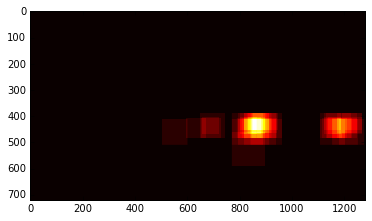

In [211]:
heatmap_img = np.zeros_like(test_img[:,:,0])
heatmap_img = add_heat(heatmap_img,rectangles)
plt.imshow(heatmap_img, cmap='hot')

In [212]:
def apply_threshold(heatmap,threshold):
    
    heatmap[heatmap <= threshold] = 0
    
    return heatmap


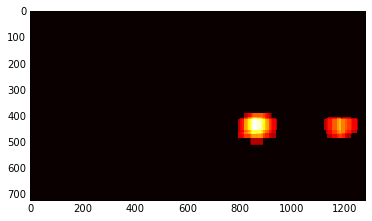

In [213]:
heatmap_img = apply_threshold(heatmap_img, 4)

plt.imshow(heatmap_img, cmap='hot')

2 cars found


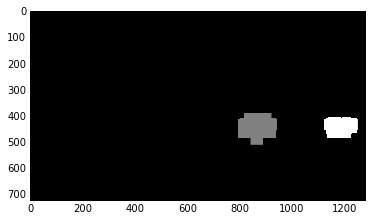

In [214]:
from scipy.ndimage.measurements import label

#heatmap_img = apply_threshold(heatmap_img, 2)
labels = label(heatmap_img)
print(labels[1], 'cars found')
plt.imshow(labels[0], cmap='gray')

In [215]:
def draw_labeled_bboxes(img, labels):
    
    rectangles = []
    
    for car_number in range(1,labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        bbox = ((np.min(nonzerox),np.min(nonzeroy)),(np.max(nonzerox),np.max(nonzeroy)))
        rectangles.append(bbox)
        cv2.rectangle(img,bbox[0],bbox[1],(0,0,255),6)
        
        
    return img, rectangles


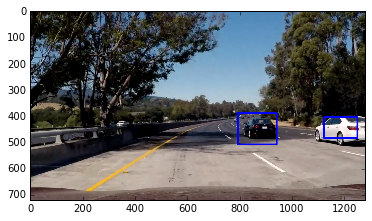

In [216]:
draw_img,rects = draw_labeled_bboxes(np.copy(test_img), labels)


plt.imshow(draw_img)


## Processing Pipeline

In [29]:
def processing_pipeline(img):
    
    test_img = np.copy(img)

    rects = []

    color_space = 'LUV'
    orient = 11  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    spatial_size = (32, 32) # Spatial binning dimensions
    hist_bins = 32    # Number of histogram bins

    all_rectangles = False


    ystart = 390
    ystop = 470
    scale = 1.0
    rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))
    
    ystart = 390
    ystop = 494
    scale = 1.2

    rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


    ystart = 390
    ystop = 532
    scale = 1.5

    rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))


    ystart = 390
    ystop = 590
    scale = 2.0
    rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))



    ystart = 460
    ystop = 702
    scale = 3.0

    rects.append(find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles))
    
    rectangles = [item for sublist in rects for item in sublist] 
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 4)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)

    
    return draw_img
    
    

In [219]:
def processing_pipeline(img):
    
    test_img = np.copy(img)

    rects = []

    color_space = 'LUV'
    orient = 11  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    spatial_size = (32, 32) # Spatial binning dimensions
    hist_bins = 32    # Number of histogram bins

    all_rectangles = False


    ystart = 390
    ystop = 470
    scale = 1.0
    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 1)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    rects.append(rectangles)
    
    
    ystart = 390
    ystop = 494
    scale = 1.2

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)


    ystart = 390
    ystop = 532
    scale = 1.5

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)


    ystart = 430
    ystop = 590
    scale = 2.0
    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)



    ystart = 460
    ystop = 702
    scale = 3.0

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)
    
    rectangles = [item for sublist in rects for item in sublist] 

    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 1)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    return draw_img
    
    

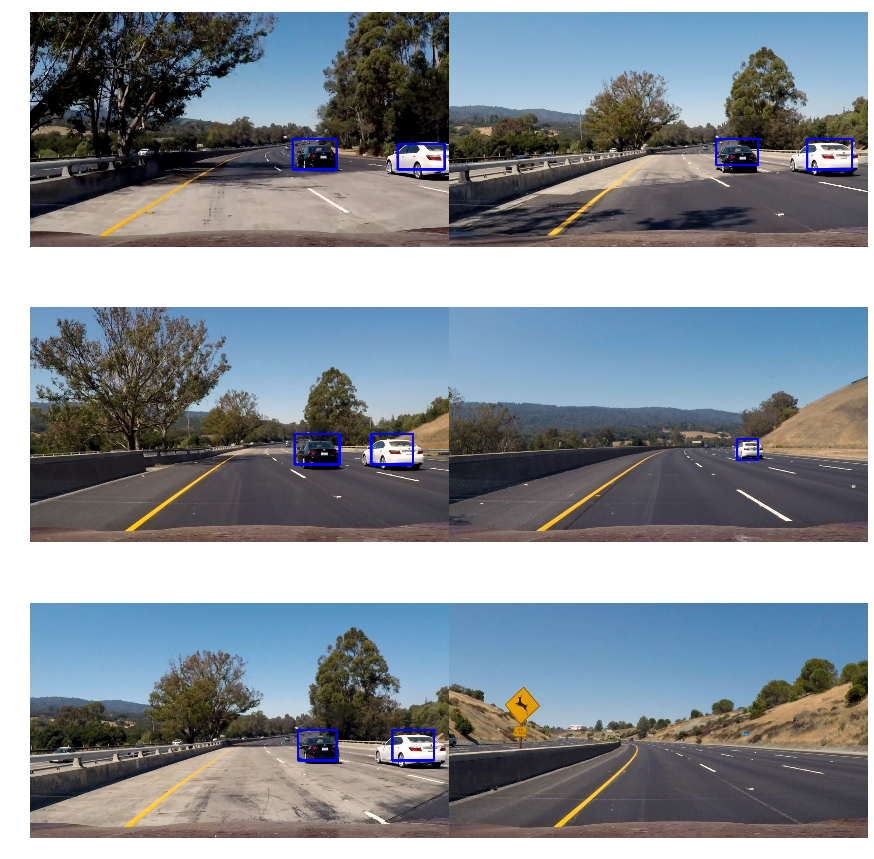

In [220]:
test_files = glob.glob('test_images/test*.jpg')

fig, axs = plt.subplots(3,2, figsize = (15,15))
fig.subplots_adjust(hspace = .2, wspace=.001)
axs = axs.ravel()

for i, file in enumerate(test_files):
    test_img = mpimg.imread(file)
    #print(processing_pipeline(test_img))
    axs[i].imshow(processing_pipeline(test_img))
    axs[i].axis('off')



In [93]:
class Vehicle_Detect():
    def __init__(self):
        self.pre_rects = []
        
    def add_rects(self,rects):
        self.pre_rects.append(rects)
        if len(self.pre_rects) > 12:
            self.pre_rects = self.pre_rects[len(self.pre_rects)-12:]
            
    

In [147]:
def video_processing_pipeline_debug(img):
    
    test_img = np.copy(img)

    rects = []

    color_space = 'LUV'
    orient = 11  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    spatial_size = (32, 32) # Spatial binning dimensions
    hist_bins = 32    # Number of histogram bins

    all_rectangles = False


    ystart = 390
    ystop = 470
    scale = 1.0
    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 1)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    rects.append(rectangles)
    
    
    ystart = 390
    ystop = 494
    scale = 1.2

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 1)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)


    ystart = 390
    ystop = 532
    scale = 1.5

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)


    ystart = 430
    ystop = 590
    scale = 2.0
    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)



    ystart = 460
    ystop = 702
    scale = 3.0

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)
    
    rectangles = [item for sublist in rects for item in sublist] 
    
    size = (640, 360)
    
    box_img = draw_boxes(test_img, rectangles)
    debug_box_img = cv2.resize(box_img, size)
    #print(debug_box_img.shape)
    if len(rectangles) > 0:
        det.add_rects(rectangles)
    heatmap_img = np.zeros_like(test_img[:,:,0])
    for rect_set in det.pre_rects:
        #print(rect_set)
        heatmap_img = add_heat(heatmap_img,rect_set)
        
        
    debug_heatmap_img = np.dstack([heatmap_img, heatmap_img, heatmap_img])   
    debug_heatmap_img = cv2.resize(debug_heatmap_img, size)
    #print(debug_heatmap_img.shape)
    panel = np.hstack((debug_box_img, debug_heatmap_img))

    #heatmap_img = np.zeros_like(test_img[:,:,0])
    #heatmap_img = add_heat(heatmap_img,rectangles)
    threshold = 5*len(det.pre_rects)//6+3
    heatmap = apply_threshold(heatmap_img, 25)
    labels = label(heatmap)
    heatmap_max = np.max(heatmap_img)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    cv2.putText(draw_img,'Threshold: %.2f' % threshold,(20,40), \
                    cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    cv2.putText(draw_img,'rectangles num: %.2f' % len(det.pre_rects),(20,80), \
                    cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    cv2.putText(draw_img,'max: %.2f' % heatmap_max,(20,120), \
                    cv2.FONT_HERSHEY_SIMPLEX, 1,(255,255,255),2)
    
    output = np.vstack((panel, draw_img))
    
    
    return output

In [221]:
def video_processing_pipeline(img):
    
    test_img = np.copy(img)

    rects = []

    color_space = 'LUV'
    orient = 11  # HOG orientations
    pix_per_cell = 8 # HOG pixels per cell
    cell_per_block = 2 # HOG cells per block
    spatial_size = (32, 32) # Spatial binning dimensions
    hist_bins = 32    # Number of histogram bins

    all_rectangles = False


    ystart = 390
    ystop = 470
    scale = 1.0
    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 1)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    rects.append(rectangles)
    
    
    ystart = 390
    ystop = 494
    scale = 1.2

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 1)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)


    ystart = 390
    ystop = 532
    scale = 1.5

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)


    ystart = 430
    ystop = 590
    scale = 2.0
    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)



    ystart = 460
    ystop = 702
    scale = 3.0

    rectangles=find_cars(test_img, ystart, ystop, color_space,scale, svc, X_scaler, orient
                       , pix_per_cell, cell_per_block, spatial_size, hist_bins, all_rectangles)
    
    heatmap_img = np.zeros_like(test_img[:,:,0])
    heatmap_img = add_heat(heatmap_img,rectangles)
    heatmap = apply_threshold(heatmap_img, 2)
    labels = label(heatmap)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    rects.append(rect)
    
    rectangles = [item for sublist in rects for item in sublist] 

    if len(rectangles) > 0:
        det.add_rects(rectangles)
    heatmap_img = np.zeros_like(test_img[:,:,0])
    for rect_set in det.pre_rects:
        heatmap_img = add_heat(heatmap_img,rect_set)
        
        

    threshold = 5*len(det.pre_rects)//6+3
    heatmap = apply_threshold(heatmap_img, 25)
    labels = label(heatmap)
    heatmap_max = np.max(heatmap_img)
    draw_img,rect = draw_labeled_bboxes(np.copy(test_img), labels)
    
    
    
    return draw_img

In [132]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

det = Vehicle_Detect()

test_out_file  = 'test_video_out.mp4'
clip_test = VideoFileClip('test_video.mp4')
clip_test_out = clip_test.fl_image(video_processing_pipeline)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video test_video_out.mp4
[MoviePy] Writing video test_video_out.mp4






  0%|          | 0/39 [00:00<?, ?it/s]



  3%|▎         | 1/39 [00:00<00:32,  1.17it/s]



  5%|▌         | 2/39 [00:02<00:38,  1.05s/it]



  8%|▊         | 3/39 [00:03<00:39,  1.11s/it]



 10%|█         | 4/39 [00:04<00:36,  1.05s/it]



 13%|█▎        | 5/39 [00:05<00:38,  1.13s/it]



 15%|█▌        | 6/39 [00:07<00:39,  1.20s/it]



 18%|█▊        | 7/39 [00:08<00:37,  1.17s/it]



 21%|██        | 8/39 [00:09<00:35,  1.13s/it]



 23%|██▎       | 9/39 [00:10<00:35,  1.18s/it]



 26%|██▌       | 10/39 [00:12<00:35,  1.23s/it]



 28%|██▊       | 11/39 [00:13<00:35,  1.26s/it]



 31%|███       | 12/39 [00:15<00:34,  1.28s/it]



 33%|███▎      | 13/39 [00:16<00:33,  1.30s/it]



 36%|███▌      | 14/39 [00:18<00:32,  1.32s/it]



 38%|███▊      | 15/39 [00:20<00:32,  1.34s/it]



 41%|████      | 16/39 [00:21<00:31,  1.36s/it]



 44%|████▎     | 17/39 [00:23<00:30,  1.38s/it]



 46%|████▌     | 18/39 [00:25<00:29,  1.39s/it]



 49%|████▊     | 19/39 [00:26<00:27,  1.39s/i

[MoviePy] Done.
[MoviePy] >>>> Video ready: test_video_out.mp4 

CPU times: user 4min 6s, sys: 2.88 s, total: 4min 9s
Wall time: 56.7 s


In [222]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML
det = Vehicle_Detect()


test_out_file  = 'project_video_out.mp4'
clip_test = VideoFileClip('project_video.mp4')
clip_test_out = clip_test.fl_image(video_processing_pipeline)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4








  0%|          | 0/1261 [00:00<?, ?it/s]





  0%|          | 1/1261 [00:01<29:39,  1.41s/it]





  0%|          | 2/1261 [00:02<29:51,  1.42s/it]





  0%|          | 3/1261 [00:04<31:11,  1.49s/it]





  0%|          | 4/1261 [00:05<31:22,  1.50s/it]





  0%|          | 5/1261 [00:07<30:53,  1.48s/it]





  0%|          | 6/1261 [00:08<30:36,  1.46s/it]





  1%|          | 7/1261 [00:10<30:17,  1.45s/it]





  1%|          | 8/1261 [00:11<30:26,  1.46s/it]





  1%|          | 9/1261 [00:13<30:29,  1.46s/it]





  1%|          | 10/1261 [00:14<30:18,  1.45s/it]





  1%|          | 11/1261 [00:15<30:12,  1.45s/it]





  1%|          | 12/1261 [00:17<30:05,  1.45s/it]





  1%|          | 13/1261 [00:18<30:01,  1.44s/it]





  1%|          | 14/1261 [00:20<29:59,  1.44s/it]





  1%|          | 15/1261 [00:21<29:53,  1.44s/it]





  1%|▏         | 16/1261 [00:22<29:48,  1.44s/it]





  1%|▏         | 17/1261 [00:24<29:40,  1.43s/it]





  1%|▏         | 18/12

  9%|▉         | 112/1261 [02:43<27:58,  1.46s/it]





  9%|▉         | 113/1261 [02:44<27:56,  1.46s/it]





  9%|▉         | 114/1261 [02:46<27:54,  1.46s/it]





  9%|▉         | 115/1261 [02:47<27:52,  1.46s/it]





  9%|▉         | 116/1261 [02:49<27:50,  1.46s/it]





  9%|▉         | 117/1261 [02:50<27:48,  1.46s/it]





  9%|▉         | 118/1261 [02:52<27:47,  1.46s/it]





  9%|▉         | 119/1261 [02:53<27:45,  1.46s/it]





 10%|▉         | 120/1261 [02:55<27:43,  1.46s/it]





 10%|▉         | 121/1261 [02:56<27:42,  1.46s/it]





 10%|▉         | 122/1261 [02:57<27:41,  1.46s/it]





 10%|▉         | 123/1261 [02:59<27:39,  1.46s/it]





 10%|▉         | 124/1261 [03:00<27:38,  1.46s/it]





 10%|▉         | 125/1261 [03:02<27:38,  1.46s/it]





 10%|▉         | 126/1261 [03:04<27:37,  1.46s/it]





 10%|█         | 127/1261 [03:05<27:36,  1.46s/it]





 10%|█         | 128/1261 [03:07<27:35,  1.46s/it]





 10%|█         | 129/1261 [03:08<27:34,  1.46s/i

 18%|█▊        | 222/1261 [05:26<25:27,  1.47s/it]





 18%|█▊        | 223/1261 [05:27<25:26,  1.47s/it]





 18%|█▊        | 224/1261 [05:29<25:24,  1.47s/it]





 18%|█▊        | 225/1261 [05:30<25:23,  1.47s/it]





 18%|█▊        | 226/1261 [05:32<25:22,  1.47s/it]





 18%|█▊        | 227/1261 [05:33<25:20,  1.47s/it]





 18%|█▊        | 228/1261 [05:35<25:19,  1.47s/it]





 18%|█▊        | 229/1261 [05:37<25:18,  1.47s/it]





 18%|█▊        | 230/1261 [05:38<25:19,  1.47s/it]





 18%|█▊        | 231/1261 [05:40<25:17,  1.47s/it]





 18%|█▊        | 232/1261 [05:41<25:16,  1.47s/it]





 18%|█▊        | 233/1261 [05:43<25:15,  1.47s/it]





 19%|█▊        | 234/1261 [05:44<25:13,  1.47s/it]





 19%|█▊        | 235/1261 [05:46<25:11,  1.47s/it]





 19%|█▊        | 236/1261 [05:47<25:09,  1.47s/it]





 19%|█▉        | 237/1261 [05:49<25:08,  1.47s/it]





 19%|█▉        | 238/1261 [05:50<25:06,  1.47s/it]





 19%|█▉        | 239/1261 [05:52<25:05,  1.47s/i

 26%|██▋       | 332/1261 [08:12<22:58,  1.48s/it]





 26%|██▋       | 333/1261 [08:13<22:56,  1.48s/it]





 26%|██▋       | 334/1261 [08:15<22:54,  1.48s/it]





 27%|██▋       | 335/1261 [08:16<22:53,  1.48s/it]





 27%|██▋       | 336/1261 [08:18<22:52,  1.48s/it]





 27%|██▋       | 337/1261 [08:20<22:51,  1.48s/it]





 27%|██▋       | 338/1261 [08:22<22:51,  1.49s/it]





 27%|██▋       | 339/1261 [08:23<22:50,  1.49s/it]





 27%|██▋       | 340/1261 [08:25<22:49,  1.49s/it]





 27%|██▋       | 341/1261 [08:27<22:48,  1.49s/it]





 27%|██▋       | 342/1261 [08:28<22:47,  1.49s/it]





 27%|██▋       | 343/1261 [08:30<22:45,  1.49s/it]





 27%|██▋       | 344/1261 [08:31<22:44,  1.49s/it]





 27%|██▋       | 345/1261 [08:33<22:42,  1.49s/it]





 27%|██▋       | 346/1261 [08:34<22:41,  1.49s/it]





 28%|██▊       | 347/1261 [08:36<22:39,  1.49s/it]





 28%|██▊       | 348/1261 [08:37<22:38,  1.49s/it]





 28%|██▊       | 349/1261 [08:39<22:36,  1.49s/i

 35%|███▌      | 442/1261 [10:54<20:12,  1.48s/it]





 35%|███▌      | 443/1261 [10:55<20:11,  1.48s/it]





 35%|███▌      | 444/1261 [10:57<20:09,  1.48s/it]





 35%|███▌      | 445/1261 [10:58<20:07,  1.48s/it]





 35%|███▌      | 446/1261 [11:00<20:06,  1.48s/it]





 35%|███▌      | 447/1261 [11:01<20:04,  1.48s/it]





 36%|███▌      | 448/1261 [11:03<20:03,  1.48s/it]





 36%|███▌      | 449/1261 [11:04<20:01,  1.48s/it]





 36%|███▌      | 450/1261 [11:05<20:00,  1.48s/it]





 36%|███▌      | 451/1261 [11:07<19:58,  1.48s/it]





 36%|███▌      | 452/1261 [11:08<19:57,  1.48s/it]





 36%|███▌      | 453/1261 [11:10<19:55,  1.48s/it]





 36%|███▌      | 454/1261 [11:11<19:54,  1.48s/it]





 36%|███▌      | 455/1261 [11:13<19:52,  1.48s/it]





 36%|███▌      | 456/1261 [11:14<19:50,  1.48s/it]





 36%|███▌      | 457/1261 [11:15<19:49,  1.48s/it]





 36%|███▋      | 458/1261 [11:17<19:47,  1.48s/it]





 36%|███▋      | 459/1261 [11:18<19:46,  1.48s/i

 44%|████▍     | 552/1261 [13:34<17:26,  1.48s/it]





 44%|████▍     | 553/1261 [13:36<17:25,  1.48s/it]





 44%|████▍     | 554/1261 [13:37<17:23,  1.48s/it]





 44%|████▍     | 555/1261 [13:39<17:22,  1.48s/it]





 44%|████▍     | 556/1261 [13:40<17:20,  1.48s/it]





 44%|████▍     | 557/1261 [13:42<17:19,  1.48s/it]





 44%|████▍     | 558/1261 [13:43<17:17,  1.48s/it]





 44%|████▍     | 559/1261 [13:45<17:16,  1.48s/it]





 44%|████▍     | 560/1261 [13:46<17:14,  1.48s/it]





 44%|████▍     | 561/1261 [13:47<17:13,  1.48s/it]





 45%|████▍     | 562/1261 [13:49<17:11,  1.48s/it]





 45%|████▍     | 563/1261 [13:50<17:10,  1.48s/it]





 45%|████▍     | 564/1261 [13:52<17:08,  1.48s/it]





 45%|████▍     | 565/1261 [13:53<17:06,  1.48s/it]





 45%|████▍     | 566/1261 [13:55<17:05,  1.48s/it]





 45%|████▍     | 567/1261 [13:56<17:03,  1.48s/it]





 45%|████▌     | 568/1261 [13:58<17:02,  1.48s/it]





 45%|████▌     | 569/1261 [13:59<17:00,  1.48s/i

 52%|█████▏    | 662/1261 [16:15<14:42,  1.47s/it]





 53%|█████▎    | 663/1261 [16:16<14:41,  1.47s/it]





 53%|█████▎    | 664/1261 [16:18<14:39,  1.47s/it]





 53%|█████▎    | 665/1261 [16:19<14:38,  1.47s/it]





 53%|█████▎    | 666/1261 [16:21<14:36,  1.47s/it]





 53%|█████▎    | 667/1261 [16:22<14:35,  1.47s/it]





 53%|█████▎    | 668/1261 [16:24<14:33,  1.47s/it]





 53%|█████▎    | 669/1261 [16:25<14:32,  1.47s/it]





 53%|█████▎    | 670/1261 [16:27<14:30,  1.47s/it]





 53%|█████▎    | 671/1261 [16:28<14:29,  1.47s/it]





 53%|█████▎    | 672/1261 [16:29<14:27,  1.47s/it]





 53%|█████▎    | 673/1261 [16:31<14:26,  1.47s/it]





 53%|█████▎    | 674/1261 [16:32<14:24,  1.47s/it]





 54%|█████▎    | 675/1261 [16:34<14:23,  1.47s/it]





 54%|█████▎    | 676/1261 [16:35<14:21,  1.47s/it]





 54%|█████▎    | 677/1261 [16:37<14:20,  1.47s/it]





 54%|█████▍    | 678/1261 [16:38<14:18,  1.47s/it]





 54%|█████▍    | 679/1261 [16:40<14:17,  1.47s/i

 61%|██████    | 772/1261 [19:00<12:02,  1.48s/it]





 61%|██████▏   | 773/1261 [19:01<12:00,  1.48s/it]





 61%|██████▏   | 774/1261 [19:03<11:59,  1.48s/it]





 61%|██████▏   | 775/1261 [19:05<11:58,  1.48s/it]





 62%|██████▏   | 776/1261 [19:06<11:56,  1.48s/it]





 62%|██████▏   | 777/1261 [19:07<11:55,  1.48s/it]





 62%|██████▏   | 778/1261 [19:09<11:53,  1.48s/it]





 62%|██████▏   | 779/1261 [19:10<11:52,  1.48s/it]





 62%|██████▏   | 780/1261 [19:12<11:50,  1.48s/it]





 62%|██████▏   | 781/1261 [19:13<11:49,  1.48s/it]





 62%|██████▏   | 782/1261 [19:15<11:47,  1.48s/it]





 62%|██████▏   | 783/1261 [19:16<11:46,  1.48s/it]





 62%|██████▏   | 784/1261 [19:18<11:44,  1.48s/it]





 62%|██████▏   | 785/1261 [19:19<11:43,  1.48s/it]





 62%|██████▏   | 786/1261 [19:21<11:41,  1.48s/it]





 62%|██████▏   | 787/1261 [19:22<11:40,  1.48s/it]





 62%|██████▏   | 788/1261 [19:24<11:38,  1.48s/it]





 63%|██████▎   | 789/1261 [19:25<11:37,  1.48s/i

 70%|██████▉   | 882/1261 [21:44<09:20,  1.48s/it]





 70%|███████   | 883/1261 [21:46<09:19,  1.48s/it]





 70%|███████   | 884/1261 [21:47<09:17,  1.48s/it]





 70%|███████   | 885/1261 [21:49<09:16,  1.48s/it]





 70%|███████   | 886/1261 [21:50<09:14,  1.48s/it]





 70%|███████   | 887/1261 [21:51<09:13,  1.48s/it]





 70%|███████   | 888/1261 [21:53<09:11,  1.48s/it]





 70%|███████   | 889/1261 [21:54<09:10,  1.48s/it]





 71%|███████   | 890/1261 [21:56<09:08,  1.48s/it]





 71%|███████   | 891/1261 [21:57<09:07,  1.48s/it]





 71%|███████   | 892/1261 [21:59<09:05,  1.48s/it]





 71%|███████   | 893/1261 [22:00<09:04,  1.48s/it]





 71%|███████   | 894/1261 [22:02<09:02,  1.48s/it]





 71%|███████   | 895/1261 [22:03<09:01,  1.48s/it]





 71%|███████   | 896/1261 [22:05<08:59,  1.48s/it]





 71%|███████   | 897/1261 [22:06<08:58,  1.48s/it]





 71%|███████   | 898/1261 [22:07<08:56,  1.48s/it]





 71%|███████▏  | 899/1261 [22:09<08:55,  1.48s/i

 79%|███████▊  | 992/1261 [24:25<06:37,  1.48s/it]





 79%|███████▊  | 993/1261 [24:27<06:35,  1.48s/it]





 79%|███████▉  | 994/1261 [24:28<06:34,  1.48s/it]





 79%|███████▉  | 995/1261 [24:30<06:32,  1.48s/it]





 79%|███████▉  | 996/1261 [24:31<06:31,  1.48s/it]





 79%|███████▉  | 997/1261 [24:33<06:30,  1.48s/it]





 79%|███████▉  | 998/1261 [24:34<06:28,  1.48s/it]





 79%|███████▉  | 999/1261 [24:35<06:27,  1.48s/it]





 79%|███████▉  | 1000/1261 [24:37<06:25,  1.48s/it]





 79%|███████▉  | 1001/1261 [24:38<06:24,  1.48s/it]





 79%|███████▉  | 1002/1261 [24:40<06:22,  1.48s/it]





 80%|███████▉  | 1003/1261 [24:41<06:21,  1.48s/it]





 80%|███████▉  | 1004/1261 [24:43<06:19,  1.48s/it]





 80%|███████▉  | 1005/1261 [24:44<06:18,  1.48s/it]





 80%|███████▉  | 1006/1261 [24:46<06:16,  1.48s/it]





 80%|███████▉  | 1007/1261 [24:47<06:15,  1.48s/it]





 80%|███████▉  | 1008/1261 [24:49<06:13,  1.48s/it]





 80%|████████  | 1009/1261 [24:50<06:12

 87%|████████▋ | 1101/1261 [27:04<03:56,  1.48s/it]





 87%|████████▋ | 1102/1261 [27:05<03:54,  1.48s/it]





 87%|████████▋ | 1103/1261 [27:07<03:53,  1.48s/it]





 88%|████████▊ | 1104/1261 [27:08<03:51,  1.48s/it]





 88%|████████▊ | 1105/1261 [27:10<03:50,  1.48s/it]





 88%|████████▊ | 1106/1261 [27:11<03:48,  1.48s/it]





 88%|████████▊ | 1107/1261 [27:12<03:47,  1.48s/it]





 88%|████████▊ | 1108/1261 [27:14<03:45,  1.48s/it]





 88%|████████▊ | 1109/1261 [27:15<03:44,  1.48s/it]





 88%|████████▊ | 1110/1261 [27:17<03:42,  1.47s/it]





 88%|████████▊ | 1111/1261 [27:18<03:41,  1.47s/it]





 88%|████████▊ | 1112/1261 [27:20<03:39,  1.47s/it]





 88%|████████▊ | 1113/1261 [27:21<03:38,  1.47s/it]





 88%|████████▊ | 1114/1261 [27:22<03:36,  1.47s/it]





 88%|████████▊ | 1115/1261 [27:24<03:35,  1.47s/it]





 89%|████████▊ | 1116/1261 [27:25<03:33,  1.47s/it]





 89%|████████▊ | 1117/1261 [27:27<03:32,  1.47s/it]





 89%|████████▊ | 1118/1261 [27:

 96%|█████████▌| 1210/1261 [29:40<01:15,  1.47s/it]





 96%|█████████▌| 1211/1261 [29:42<01:13,  1.47s/it]





 96%|█████████▌| 1212/1261 [29:43<01:12,  1.47s/it]





 96%|█████████▌| 1213/1261 [29:45<01:10,  1.47s/it]





 96%|█████████▋| 1214/1261 [29:46<01:09,  1.47s/it]





 96%|█████████▋| 1215/1261 [29:48<01:07,  1.47s/it]





 96%|█████████▋| 1216/1261 [29:49<01:06,  1.47s/it]





 97%|█████████▋| 1217/1261 [29:50<01:04,  1.47s/it]





 97%|█████████▋| 1218/1261 [29:52<01:03,  1.47s/it]





 97%|█████████▋| 1219/1261 [29:53<01:01,  1.47s/it]





 97%|█████████▋| 1220/1261 [29:55<01:00,  1.47s/it]





 97%|█████████▋| 1221/1261 [29:56<00:58,  1.47s/it]





 97%|█████████▋| 1222/1261 [29:57<00:57,  1.47s/it]





 97%|█████████▋| 1223/1261 [29:59<00:55,  1.47s/it]





 97%|█████████▋| 1224/1261 [30:00<00:54,  1.47s/it]





 97%|█████████▋| 1225/1261 [30:02<00:52,  1.47s/it]





 97%|█████████▋| 1226/1261 [30:03<00:51,  1.47s/it]





 97%|█████████▋| 1227/1261 [30:

[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 2h 17min 32s, sys: 1min 34s, total: 2h 19min 7s
Wall time: 30min 54s


In [141]:
import os
from moviepy.editor import *

def extract_frames(movie, times, imgdir):
    clip = VideoFileClip(movie)
    for t in times:
        imgpath = os.path.join(imgdir, '{}.png'.format(t))
        clip.save_frame(imgpath, t)

movie = 'project_video_out.mp4'
imgdir = 'frames'
times =  17.1,17.2,17.3,17.4,17.5,17.6,17.7,17.8,17.9,18,18.1,18.2,18.3,18.4,18.5,18.6

extract_frames(movie, times, imgdir)

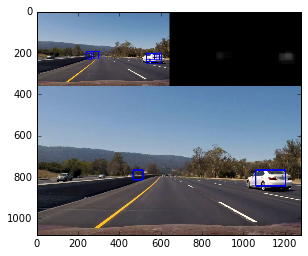

In [112]:
cap_image = mpimg.imread('frames/11.5.png')
plt.imshow(cap_image)